In [1]:
import os
import timeit
import time
import numpy as np
from collections import OrderedDict
from pprint import pformat
from tqdm import tqdm
from google.colab import drive

import torch
import torch.nn as nn
import torch.nn.init as init
import torch.nn.functional as F
import torch.backends.cudnn as cudnn
from torch.utils.data.sampler import *
from torchvision import transforms, datasets
import matplotlib.pyplot as plt
%load_ext tensorboard
torch.multiprocessing.set_sharing_strategy('file_system')
cudnn.benchmark = True


In [2]:
# CITATIONS:
# Config is inspired by ResNet, and p values for dropout are based on the paper by Geoffrey Hinton ("Dropout: A Simple Way to Prevent Neural Networks from Overfitting")
# Batch size citation:  Nitish Shirish Keskar, Dheevatsa Mudigere, Jorge Nocedal, Mikhail Smelyanskiy, Ping Tak Peter Tang. On Large-Batch Training for Deep Learning: Generalization Gap and Sharp Minima. https://arxiv.org/abs/1609.04836
# Skip Connection justification: He, Kaiming; Zhang, Xiangyu; Ren, Shaoqing; Sun, Jian (2015-12-10). "Deep Residual Learning for Image Recognition". arXiv:1512.03385 [cs.CV].
# He, Kaiming; Zhang, Xiangyu; Ren, Shaoqing; Sun, Jian (2016). "Deep Residual Learning for Image Recognition" (PDF). Proc. Computer Vision and Pattern Recognition (CVPR), IEEE. Retrieved 2020-04-23.
# Structure of code referenced from Cmput 328 University of Alberta assignment 3.
"""
Report:
This model trained around 50 epochs achieves a test accuracy of ~87%. 
Note that Skip Connection has been used between the input and the second block to yield
variation and experimentation. It turned out that skipping the first block and feeding 
the input to the second block along with the output of the first block was beneficial.
The printing can be turned off by simply commenting out the print statement in train(), and test()
although it is advisable to see progress, if running train().
Manual testing is commented in the run function.
"""

class Net(nn.Module):
      def __init__(self):
        super(Net, self).__init__()
        """
            Conv2D for convolutional layers: 
            nn.Conv2d(in_channels=80, out_channels=64, kernel_size=3, padding=1), #Layer6
            nn.ReLU(inplace=True),
            https://pytorch.org/docs/stable/generated/torch.nn.Conv2d.html        
            out_size = (in_size - (kernel_size - 1) + 2*padding) / stride    

        """
        #First block
        self.block_1 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, padding=1), #Layer1
            nn.BatchNorm2d(32), #Batch Normalization: num_features as mentioned must be equal to the out_channels of the previous layer.
            nn.ReLU(inplace=True),  
            nn.Conv2d(in_channels=32, out_channels=3, kernel_size=3, padding=1), #Layer2
            nn.ReLU(inplace=True),  #ReLU activation function
            nn.MaxPool2d(kernel_size=1, stride=1) #MaxPooling with 1x1 filter just so that skip connection can be applied to the next layer
        )
        #Second block
        self.block_2 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=128, kernel_size=3, padding=1), #Layer3
            nn.BatchNorm2d(128), #Batch Normalization 
            nn.ReLU(inplace=True), #ReLU activation
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, padding=1), #Layer4
            nn.ReLU(inplace=True), #ReLU activation
            nn.MaxPool2d(kernel_size=2, stride=2), #2x2 Maxpooling filter 
            nn.Dropout2d(p=0.05), #Dropout with value p = 0.05 to help prevent overfitting. p is the probability value.
        )
        #Third block
        self.block_3 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, padding=1), #Layer5
            nn.BatchNorm2d(256), #Batch Normalization
            nn.ReLU(inplace=True), #ReLU activation
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.MaxPool2d(kernel_size=2, stride=2) #MaxPooling with a 2x2 filter.
            )
        #Fully Connected
        self.fc_layer = nn.Sequential(
            nn.Dropout(p=0.1), #Dropout with p = 0.1, justification based on the paper mentioned above^
            nn.Linear(256*64,4096),
            nn.ReLU(True),
            nn.Linear(4096, 1024), #Linear transformation of 4096 features, outputting 1024 features
            nn.ReLU(inplace=True), #ReLU activation function on the layer
            nn.Linear(1024, 512),  #Linear transformation of 1024 features, outputting 512 features
            nn.ReLU(inplace=True), #ReLU activation
            nn.Dropout(p=0.1),     # Dropout as mentioned above
            nn.Linear(512, 10),     # Finaly linear transformation, transforming 512 features into 10 (number of classes)
        )
      def forward(self, x): #outputs highlighted, inputs above.
          residual = x   #3x32x32
          x = self.block_1(x) #3x32x32
          x+=residual #Skip Connection #3x32x32
          x=self.block_2(x) #128x16x16
          x = self.block_3(x) #64x8x8
          x = x.view(x.size(0), -1) #4096
          x = self.fc_layer(x) #10
          return F.log_softmax(x)


In [3]:
# TODO: Cifar-10 dataloading
def load_data(config):
    """
    Load cifar-10 dataset using torchvision, take the last 5k of the training data to be validation data
    """
    transform_train = transforms.Compose([
        transforms.RandomCrop(32, padding=4),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
    ])

    transform_test = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
    ])

    CIFAR_trainset = datasets.CIFAR10(root='./data',train=True, download = True, transform = transform_train)
    CIFAR_trainloader = torch.utils.data.DataLoader(CIFAR_trainset,batch_size = config['batch_size'],shuffle=True,num_workers=2)
    CIFAR_testset = datasets.CIFAR10(root="./data",train=False,download=True,transform=transform_test)
    CIFAR_testloader = torch.utils.data.DataLoader(CIFAR_testset,batch_size = config['batch_size_test'],shuffle=True,num_workers=2)
    """
      Using the last 5k images for validation.
    """
    training_subset = list(range(0,45000))
    validation_subset = list(range(45000,50000))

    CIFAR_training_set = torch.utils.data.Subset(CIFAR_trainset,training_subset)
    CIFAR_validation_set = torch.utils.data.Subset(CIFAR_trainset,validation_subset)

    train_dataloader = torch.utils.data.DataLoader(CIFAR_training_set,batch_size=config['batch_size'], shuffle=True)
    valid_dataloader = torch.utils.data.DataLoader(CIFAR_validation_set,batch_size=config['batch_size'], shuffle=True)
    test_dataloader = torch.utils.data.DataLoader(CIFAR_testset,batch_size=config['batch_size_test'], shuffle=True)

    return train_dataloader, valid_dataloader, test_dataloader

In [4]:
# TODO : Main trainig + validation, returns the final model, save your best checkpoint based on the best validation accuracy
def train(trainloader, valid_dataloader, device, config):
    """
     The function used to train the model.
     :params: 
     trainloader: refers to the training set.
     validloader: refers to the validation set.
     device: refers to the device used for computation
     config: refers to the dataset-dependent-dictionary passed.
     return: model -- Used for testing in run()

    """

    net = Net().to(device)
    optimizer=torch.optim.SGD(net.parameters(),lr=config['lr'],momentum = config['momentum'],weight_decay=config['regular_constant'])
    net.train()   #Mode of the network being set to train, essentially to allow efficient computation of gradients and the other methods
                  #that are 'turned off' when switching to model.eval() to compute efficiently, more details below.
    maxAcc = -float('inf') #Could be set to 0 because we're dealing with percentages, but this is the algorithmic way to maintain runningMax


    """
    Important to set the mode of the model to training mode -- in this mode, backward is used to
    compute many gradient calculation efficiently. Contrary to the model.eval() mode where training
    is set to false.
    """
    dummy_loss=0
    plotLoss,accPlot = [],[]

    for epoch in range(1,config['epochs']+1):       # epochs for number of outer iterations as the inner loop goes through the dataset.
      for batch_idx, (image,label) in  enumerate(trainloader):   # Same thing as before, image, and label correspond to their respective names of the dataset.

        """
        The documentation is similar to that of test function, however, there a few key differences.
        Note that torch.no_grad() isn't used here because we need the gradients to backpropogate.
        Optimizer.zero_grad() cleans the gradients, and computation is done with loss.backward()
        Optimizer.step() is necessary as it is used to update the parameters after backward() is finished.
        """
        image=image.to(device)   
        label=label.to(device)
        optimizer.zero_grad()
        criterion = torch.nn.CrossEntropyLoss()
        output = net(image)
        loss = criterion(output,label)
        """
        Comment out this writer to get rid of GPU memory issues.
        """
        writer.add_graph(net,image)
        plotLoss.append(loss.item())
        dummy_loss+=loss
        loss.backward()
        optimizer.step()

        #Monitoring progress
        if batch_idx % 100 == 0:
          print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(epoch, batch_idx * len(image), len(trainloader.dataset),
          100. * batch_idx / len(trainloader), loss.item()))

      #Validating after every few epochs
      if epoch<config['epochs']+1:    
          a,_,_ = test(net,valid_dataloader,device) #Testing on validation data serves the same purpose as a Validation function.
          accPlot.append(a)
          net.train() #Need to flip the mode back to train because the test function is called and in there, mode of the net is set to eval()
          if maxAcc < a: #Saving model with the best accuracy
            maxAcc = a
            print(maxAcc)
            if os.path.isdir('checkpoint'):
              torch.save(net.state_dict(),'./checkpoint/ckpt.pth') #directory creation
            else:
              os.mkdir('checkpoint')
              torch.save(net.state_dict(),'./checkpoint/ckpt.pth')
    return net
  

In [5]:
from torch.utils.tensorboard import SummaryWriter

# default `log_dir` is "runs"
writer = SummaryWriter('runs/cifar10')
def test(net, testloader, device):
    """
    The function used to test the model.
    :params: 
    model: refers to the model.
    testloader: refers to the test set.
    device: refers to the device used for computation
    return: (100.*correct/total).item(), correct.item(), totals -- Used to calculate score.
    """
    from torch.utils.tensorboard import SummaryWriter

    # default `log_dir` is "runs" - we'll be more specific here
    writer = SummaryWriter('runs/cifar10')
    #Used to set training mode to false, and evaluation mode to true for the entire model. Important. 
    net.eval() 
    class_labels = [
    "Plane",
    "Car",
    "Bird",
    "Cat",
    "Deer",
    "Dog",
    "Frog",
    "Horse",
    "Boat",
    "Truck"
    ]
    test_predictions = []     #Used to contain the predictions.
    true_labels = []          #Used to contain the ground_truth labels of images.
    accPlot = []
    test_loss=0               #Calculating test loss, not required but used for debugging.
    total = 0                 #Calculating total number of labels for test accuracy, not required but used for debugging.
    correct=0                 #Calculating correct number of predictions for test accuracy, not required but used for debugging.

    """
    torch.no_grad():  Deactivates the autograd engine so it can efficiently test without having to backprop.
    Ensures that memory is efficiently used for computation as there is no backward() being called here, 
    so resources can be allocated elsewhere. Intuitively, sets require_grad=False.
    """
    def matplotlib_imshow(img, one_channel=False):
      if one_channel:
          img = img.mean(dim=0)
      img = img / 2 + 0.5     # unnormalize
      npimg = img.cpu().numpy()
      if one_channel:
          plt.imshow(npimg)
      else:
          plt.imshow(np.transpose(npimg, (1, 2, 0)))
    def images_to_probs(net, images):
      '''
      Generates predictions and corresponding probabilities from a trained
      network and a list of images
      '''
      output = net(images)
      # convert output probabilities to predicted class
      _, preds_tensor = torch.max(output, 1)
      preds = np.squeeze(preds_tensor.cpu().numpy())
      return preds, [F.softmax(el, dim=0)[i].item() for i, el in zip(preds, output)]


    def plot_classes_preds(net, images, labels):
      '''
      Generates matplotlib Figure using a trained network, along with images
      and labels from a batch, that shows the network's top prediction along
      with its probability, alongside the actual label, coloring this
      information based on whether the prediction was correct or not.
      Uses the "images_to_probs" function.
      '''
      preds, probs = images_to_probs(net, images)
      # plot the images in the batch, along with predicted and true labels
      fig = plt.figure(figsize=(10, 50))
      for idx in np.arange(5):
          ax = fig.add_subplot(1, 5, idx+1, xticks=[], yticks=[])
          matplotlib_imshow(images[idx], one_channel=True)
          ax.set_title("{0}, {1:.1f}%\n(label: {2})".format(
              class_labels[preds[idx]],
              probs[idx] * 100.0,
              class_labels[labels[idx]]),
                      color=("green" if preds[idx]==labels[idx].item() else "red"))
      return fig
    def add_pr_curve_tensorboard(class_index, test_probs, test_preds, global_step=0):
      '''
      Takes in a "class_index" from 0 to 9 and plots the corresponding
      precision-recall curve
      '''
      tensorboard_preds = test_preds == class_index
      tensorboard_probs = test_probs[:, class_index]

      writer.add_pr_curve(class_labels[class_index],
                          tensorboard_preds,
                          tensorboard_probs,
                          global_step=global_step)
      writer.close()


    class_probs = []
    class_preds = []
    with torch.no_grad():     
      for data,target in testloader:             #Self-explanatory, splits each tuple into the image and its label to iterate through.
        data=data.to(device)     #Conform the dimensions of the image to the dimensions specified above.
        target=target.to(device)                      # Ensures any computation done involving target is on GPU, will throw an error if conflicting devices are used.
        criterion = torch.nn.CrossEntropyLoss()       
        output = net(data)
        """
        Comment the lines along with plot_classes_preds and the associated variables in order to get generated 
        samples with their prediction likelihoods. Do note that with this approach it is advisable to either load a pre-trained model
        or have very few epochs as the number of these samples can blow up with a small batch size leading to 
        issues with GPU memory.
        """
        class_probs_batch = [F.softmax(el, dim=0) for el in output]
        _, class_preds_batch = torch.max(output, 1)
        class_probs.append(class_probs_batch)
        class_preds.append(class_preds_batch)                          # Necessary to conform the model to the image (data) that we have.
        test_loss+=criterion(output,target).item()    # Add the test loss.
        test_predictions.append(output.data.max(1,)[1])     #The prediction will be argument with the highest probability in the vector.
        _,a = output.data.max(1,keepdim=True)         # Dummy used to debug.
        total+=target.size(0)                         # Used to calculate accuracy.
        correct += a.eq(target.data.view_as(a)).sum() # Calculate the number of correct predictions.
        true_labels.append(target)
        _ = plot_classes_preds(net,data,target)
    test_loss /= len(testloader.dataset)         # Calculate the mean test loss


    test_probs = torch.cat([torch.stack(batch) for batch in class_probs])
    test_preds = torch.cat(class_preds)
    for i in range(len(class_labels)):
      add_pr_curve_tensorboard(i, test_probs, test_preds)
    print('\nTest set: Avg. loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(test_loss, correct, len(testloader.dataset),100. * correct / len(testloader.dataset)))  
    return (100.*correct/total).item(), correct.item(), total


In [6]:
# PLEASE READ ME!!!!
# Please refresh and you will find the metrics.
# Do note that your gpu can run out of memory because of tf events logged to tensorboard.
# In order to change prevent this, you must disable tensorboad metrics or compute using the cpu which is considerably slower.
# If you choose the former, follow along the block comments in the train and test loops.
%tensorboard --logdir=runs

<IPython.core.display.Javascript object>

In [7]:
def run():
  # Adjust the hyperparameters as you like!
  # config through trial and error, and inspiration from resNet.
  config = {
        'lr': 1e-2,
        'epochs': 1,
        'batch_size': 128,
        'batch_size_test':128,
        'num_classes': 10,
        'momentum':0.9,
        'regular_constant': 5e-3,
       }

  device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
  print(device)
  train_dataloader, valid_dataloader, test_dataloader = load_data(config)
 
  model = train(train_dataloader, valid_dataloader, device, config)

  # Manual testing:
  # model = Net().to(device)
  # drive.mount('/content/gdrive/', force_remount=True)
  # model = torch.load('/content/gdrive/My Drive/model_1604366.pt')

  model.eval()

  
  test_acc, test_correct, test_total = test(model.to(device), test_dataloader, device)

  

  return test_acc, test_correct

  

cuda


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:78: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.


Train Epoch: 1 [0/45000 (0%)]	Loss: 2.306259
Train Epoch: 1 [12800/45000 (28%)]	Loss: 1.631426
Train Epoch: 1 [25600/45000 (57%)]	Loss: 1.645462
Train Epoch: 1 [38400/45000 (85%)]	Loss: 1.222971


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



Test set: Avg. loss: 0.0113, Accuracy: 2406/5000 (48%)

48.119998931884766

Test set: Avg. loss: 0.0106, Accuracy: 5116/10000 (51%)


Result:
 OrderedDict([('correct', 5116), ('accuracy', 51.15999984741211)])


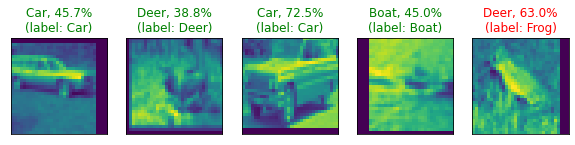

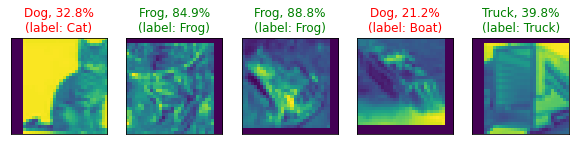

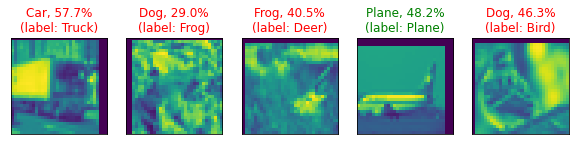

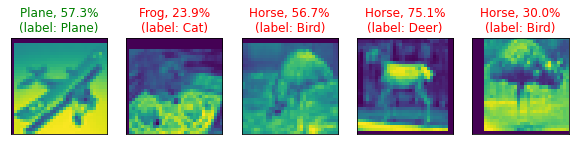

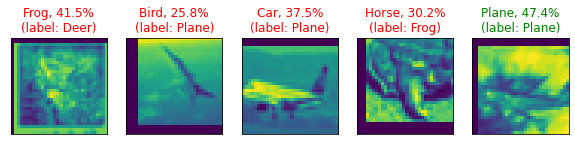

...

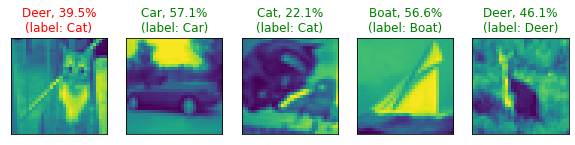

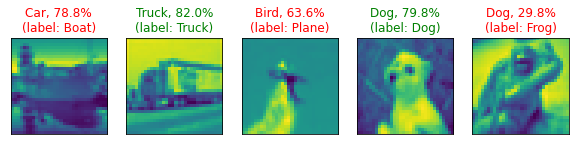

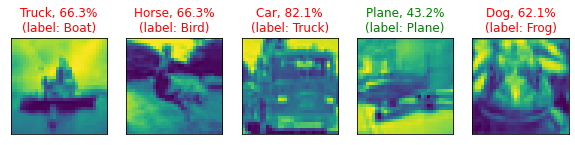

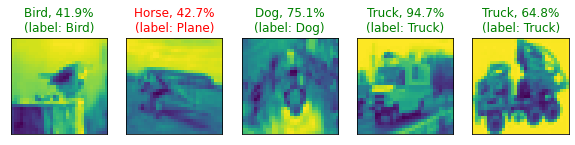

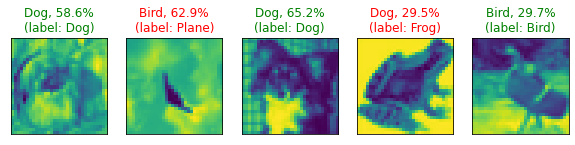

In [8]:
def main():

    accuracy, correct = run()
        
    result = OrderedDict(correct=correct,
                         accuracy=accuracy,
                         )
    
    print("\nResult:\n", pformat(result, indent=4))

main()